In [1]:
import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import torch.distributions
import torchvision
import numpy as np
import pandas as pd
import torchvision.models as models 
from torchvision import transforms, utils
from torch.utils.data.sampler import SubsetRandomSampler
import torch.optim as optim
import matplotlib.pyplot as plt
import latent_plot as lp
from torch.autograd import Variable
from torch.optim import lr_scheduler
import seaborn as sns
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
import copy
#from model import VAE

import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200
from data_loader import *
from model import convVAE
from sklearn.manifold import TSNE

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [3]:
#only on validation set
csv_path = '/home/vip/sayan-mandal/datasets/obj_criteria/20200619-objective.csv'
img_path = '/home/vip/sayan-mandal/datasets/obj_criteria/good_reduced/'

ResizeParam = 128
FD = FundusDataLoader(csv_path, img_path,transform=transforms.Compose([transforms.Resize(ResizeParam), transforms.RandomHorizontalFlip(p=0.5) ,transforms.ToTensor()]))
FD2 = FundusDataLoader(csv_path, img_path,transform=transforms.Compose([transforms.Resize(ResizeParam), transforms.ToTensor()]))

#random sampler
batch_size = 64
validation_split = .2
shuffle_dataset = True
random_seed= 42

# Creating data indices for training and validation splits:
dataset_size = len(FD)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
val_indices =  indices[:split]

# Creating PT data samplers and loaders:
valid_sampler = SubsetRandomSampler(val_indices)

#train_loader = torch.utils.data.DataLoader(FD, batch_size=batch_size, sampler=train_sampler)
data_loader = torch.utils.data.DataLoader(FD2, batch_size=batch_size, sampler=valid_sampler)

In [4]:
#implemented from
vggnet = models.__dict__['vgg19'](pretrained=True)
for param in vggnet.features.parameters():
    param.require_grad = False

#extract features from vgg123 layers
class VGG(nn.Module):
    def __init__(self, vggnet):
        super(VGG, self).__init__()
        self.conv1_1 = vggnet.features[0]
        self.conv1_2 = vggnet.features[2]
        self.conv2_1 = vggnet.features[5]
        self.conv2_2 = vggnet.features[7]
        self.conv3_1 = vggnet.features[10]
        
        self.max1 = vggnet.features[4]
        self.max2 = vggnet.features[9]

    def forward(self, x):
        out1 = F.relu(self.conv1_1(x), inplace=True)
        x = F.relu(self.conv1_2(out1), inplace=True)
        x = self.max1(x)
        out2 = F.relu(self.conv2_1(x), inplace=True)
        x = F.relu(self.conv2_2(out2), inplace=True)
        x = self.max2(x)
        out3 = F.relu(self.conv3_1(x), inplace=True)

        return out1, out2, out3

def layer_loss(pred,target):
    loss = torch.sum((pred-target).pow(2), dim=[1,2,3])
    return loss

def vggloss(x_rec, x_true, vggfeatures):
    out1_rec, out2_rec, out3_rec = vggfeatures(x_rec)
    out1_true, out2_true, out3_true = vggfeatures(x_true)

    loss1 = layer_loss(out1_rec, out1_true)
    loss2 = layer_loss(out2_rec, out2_true)
    loss3 = layer_loss(out3_rec, out3_true)
    loss = torch.mean(loss1 + loss2 + loss3)

    return loss

#kl divergence loss
#lossfunc = F.mse_loss(y,x)
#vgg feature model structure
vgg123 = VGG(vggnet).eval()
if torch.cuda.is_available(): vgg123 = vgg123.cuda()

print(vgg123)


def criterion(y, x, mu, logvar, vggfeatures, alpha = 1, beta = 1):
    # feature loss
    recon = vggloss(y,x,vggfeatures)
    #recon = F.mse_loss(y,x, reduction = 'sum')
    # kl divergence between Q(z|x) ~ N(mu, sigma) and P(z) ~ N(0, I)
    kl = torch.mean(-0.5*torch.sum(1+logvar-mu.pow(2) - logvar.exp()))
    #kl/= y.shape[0]*y.shape[1]*y.shape[2]*y.shape[3]
    return (alpha * recon + beta * kl), recon, kl


VGG(
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (max1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (max2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)


In [5]:
#analyse image difference for segmentation??
from skimage.metrics import structural_similarity
import cv2
#Obtain one batch of training images
dataiter = iter(data_loader)
data, labels = dataiter.next()
#model.eval()
#images,_,_ = model(Variable(data).cuda())
data = data.numpy()
images = data

def sim_score(before = data, after = images,idx = 0):
    before = before[idx].transpose((1,2,0))
    after = after[idx].transpose((1,2,0))
    
    before_gray = cv2.cvtColor(before, cv2.COLOR_RGB2GRAY)
    after_gray = cv2.cvtColor(after, cv2.COLOR_RGB2GRAY)

    (score, diff) = structural_similarity(before_gray, after_gray, full=True)
    return score

In [6]:
#vae model structure
nl = 2048
model = convVAE((3,128,128),nl).cuda()
model.load_state_dict(torch.load('/home/vip/sayan-mandal/vae-convmodels/dfcvae_inp128_nl'+str(nl)+'_a1b1.torch'))
print(model)

convVAE(
  (encoder): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01)
    (12): Flatten(start_dim=1, end_dim=-1)
  )
  (fc1): Sequential(
    (0): Linear(in_features=16384, out_features=4096, bias=True)
    (1): BatchNo

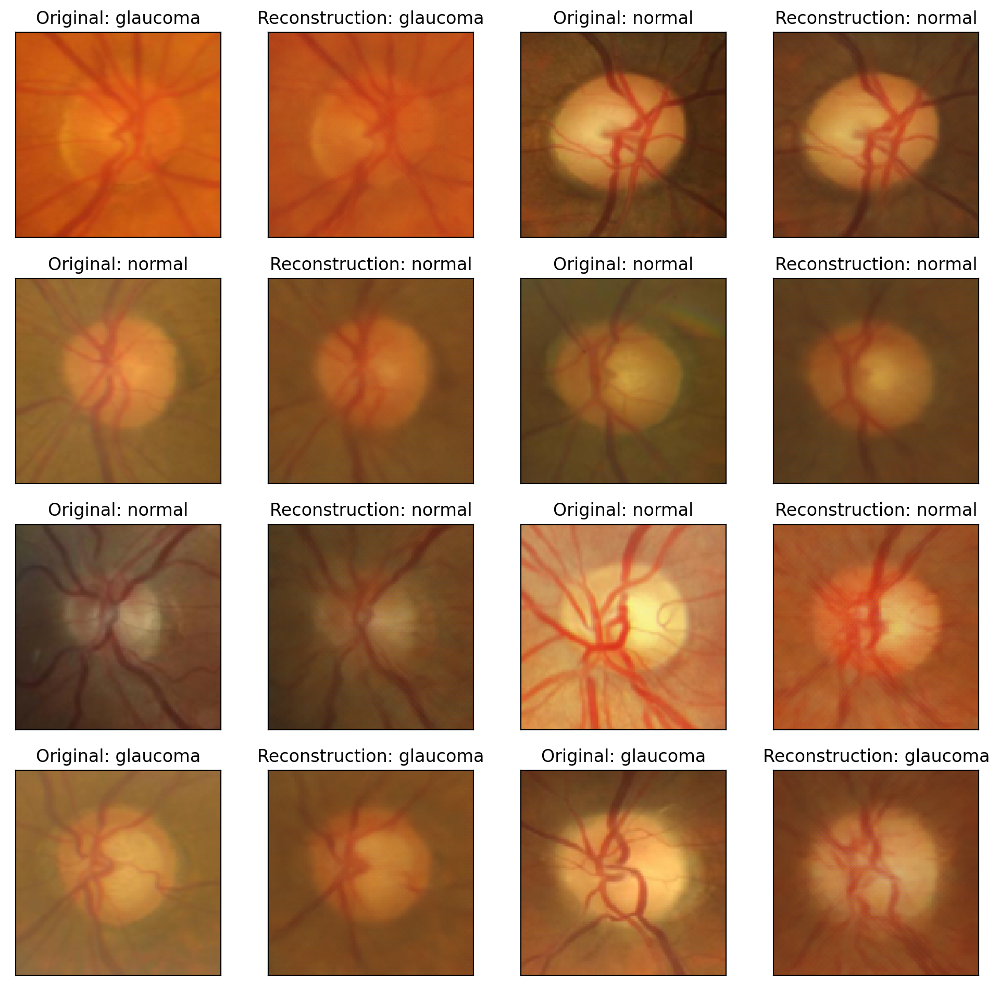

In [7]:
#Utility functions to un-normalize and display an image
def imshow(img):
    #img = img / 2 + 0.5  
    plt.imshow(np.transpose(img, (1, 2, 0))) 

#Define the image classes
classes = ['normal','glaucoma']

#Obtain one batch of training images
dataiter = iter(data_loader)
data, labels = dataiter.next()
model.eval()
images,_,_ = model(Variable(data).cuda())
images = images.detach().cpu().numpy() # convert images to numpy for display

#Plot the images
fig = plt.figure(figsize=(12, 12))
# display 20 images
idx = 0
while idx < 16:
    ax = fig.add_subplot(4,4, idx+1, xticks=[], yticks=[])
    imshow(data[idx])
    ax.set_title("Original: " + classes[labels[idx]])
    idx+=1
    ax = fig.add_subplot(4,4, idx+1, xticks=[], yticks=[])
    imshow(images[idx-1])
    ax.set_title("Reconstruction: " + classes[labels[idx-1]])
    idx+=1


In [9]:
for i, (data,label) in enumerate(data_loader):
    y, _,_, =  model.encode(Variable(data).cuda())
    y = y.cpu().detach().numpy()
    if i == 0:
        yd = y
        lbl = label.numpy()
    else:
        yd = np.append(yd,y,axis=0)
        lbl = np.append(lbl,label.numpy(), axis=0)

In [18]:
corr = []
for i in range(yd.shape[1]):
    corr+=[np.corrcoef(lbl, yd[:,i])[0][1]]

In [23]:
maxidxlist = np.abs(np.array(corr)).argsort()[::-1]

In [38]:
yd[:,maxidxlist.tolist()[:5]].shape

(1725, 5)

In [79]:
def show_difference(before = data, after = images, labels = labels,idx = 0):
    label = labels[idx]
    before = before.numpy()[idx].transpose((1,2,0))
    after = after[idx].transpose((1,2,0))
    classes = ['normal', 'glaucoma']

    before_gray = cv2.cvtColor(before, cv2.COLOR_RGB2GRAY)
    after_gray = cv2.cvtColor(after, cv2.COLOR_RGB2GRAY)

    (score, diff) = structural_similarity(before_gray, after_gray, full=True)
    before = (before*255).astype('uint8')
    diff = (diff*255).astype('uint8')
    after = (after*255).astype('uint8')
    thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]

    mask = np.zeros(before.shape, dtype='uint8')
    filled_after = after.copy()

    for c in contours:
        area = cv2.contourArea(c)
        if area < 3000 and area > 30:
            cv2.drawContours(filled_after, [c], 0, (220,220,220), 1)#thickness = cv2.FILLED)
    return before,filled_after,score

def show_difference1(before = data, after = images, labels = labels,idx = 0):
    label = labels[idx]
    before = before[idx].transpose((1,2,0))
    after = after[idx].transpose((1,2,0))
    classes = ['normal', 'glaucoma']

    before_gray = cv2.cvtColor(before, cv2.COLOR_RGB2GRAY)
    after_gray = cv2.cvtColor(after, cv2.COLOR_RGB2GRAY)

    (score, diff) = structural_similarity(before_gray, after_gray, full=True)
    before = (before*255).astype('uint8')
    diff = (diff*255).astype('uint8')
    after = (after*255).astype('uint8')
    thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]

    mask = np.zeros(before.shape, dtype='uint8')
    filled_after = after.copy()

    for c in contours:
        area = cv2.contourArea(c)
        if area < 5000 and area > 10:
            cv2.drawContours(filled_after, [c], 0, (220,220,220), 1)#thickness = cv2.FILLED)
    return before,filled_after,score

In [90]:
##analyzing effect of latent features on glaucoma
#Obtain one batch of training images
dataiter = iter(data_loader)
data, labels = dataiter.next()
model.eval()
ls,_,_ = model.encode(Variable(data).cuda())
ls_10 = copy.deepcopy(ls.detach().cpu())
ls_100 = copy.deepcopy(ls.detach().cpu())
ls_1000 = copy.deepcopy(ls.detach().cpu())
#images = images.detach().cpu().numpy() # convert images to numpy for display
ls_10[:,maxidxlist.tolist()[:50]] = 0
ls_100[:,maxidxlist.tolist()[:100]] = 0
ls_1000[:,maxidxlist.tolist()[:250]] = 0

images = model.decode(Variable(ls).cuda())
images = images.detach().cpu().numpy() # convert images to numpy for display
images10 = model.decode(Variable(ls_10).cuda())
images10 = images10.detach().cpu().numpy() # convert images to numpy for display
images100 = model.decode(Variable(ls_100).cuda())
images100 = images100.detach().cpu().numpy() # convert images to numpy for display
images1000 = model.decode(Variable(ls_1000).cuda())
images1000 = images1000.detach().cpu().numpy() # convert images to numpy for display

#ls_10 = copy.deepcopy(ls.detach().cpu())

In [91]:
i = 0
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)


Text(0.5, 1.0, 'Original: normal')

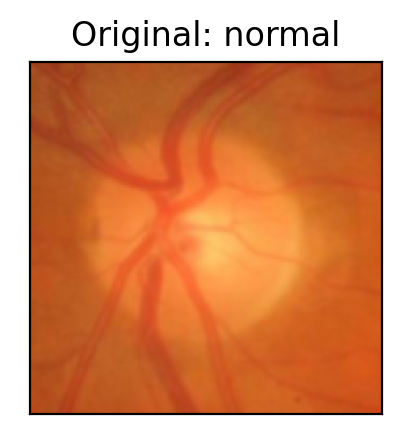

In [92]:
#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])

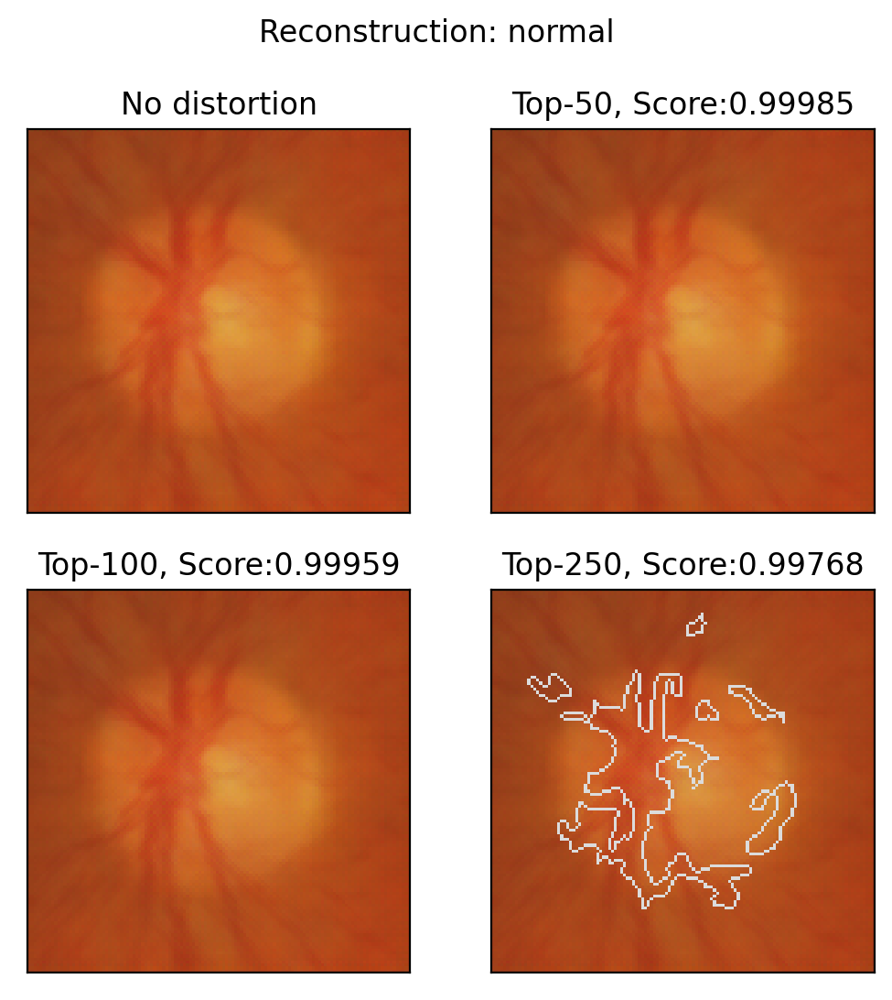

In [93]:
fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

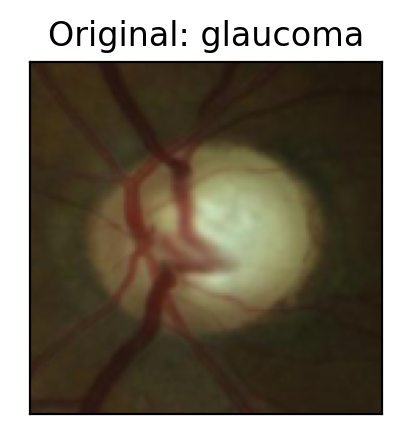

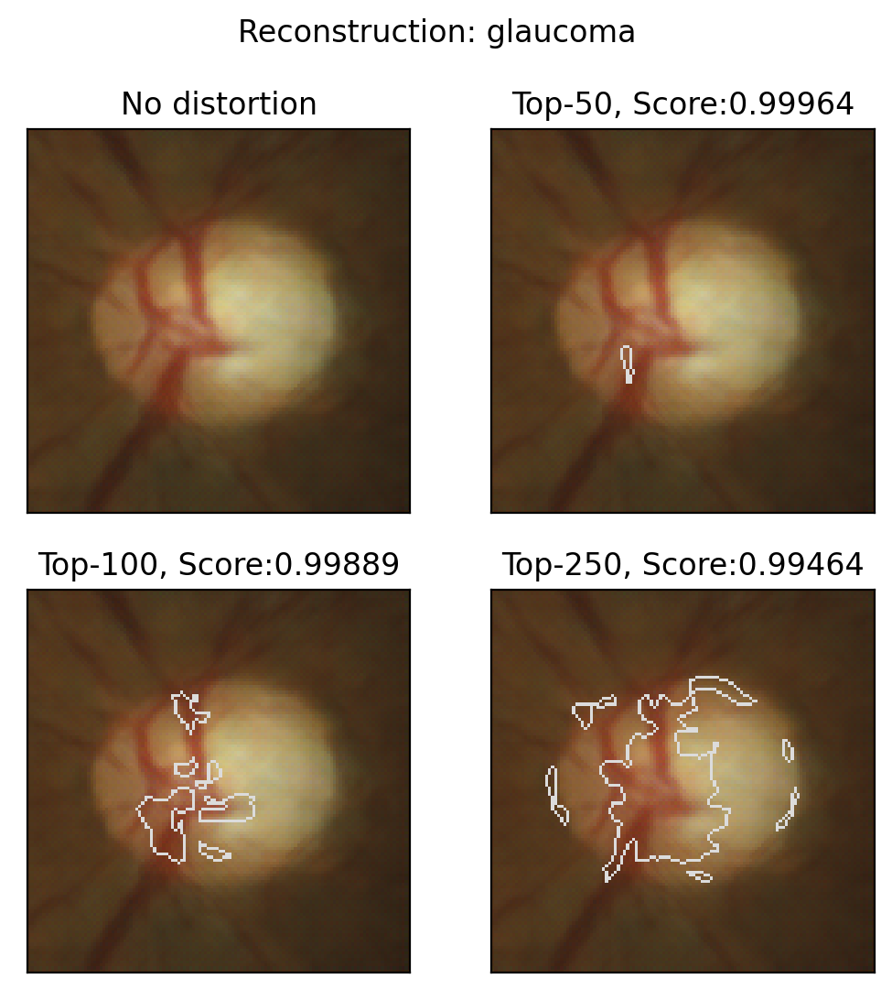

In [94]:
i = 2
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

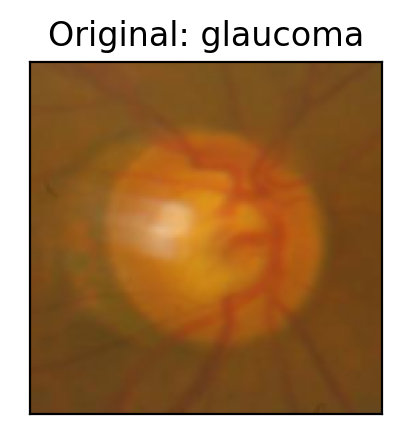

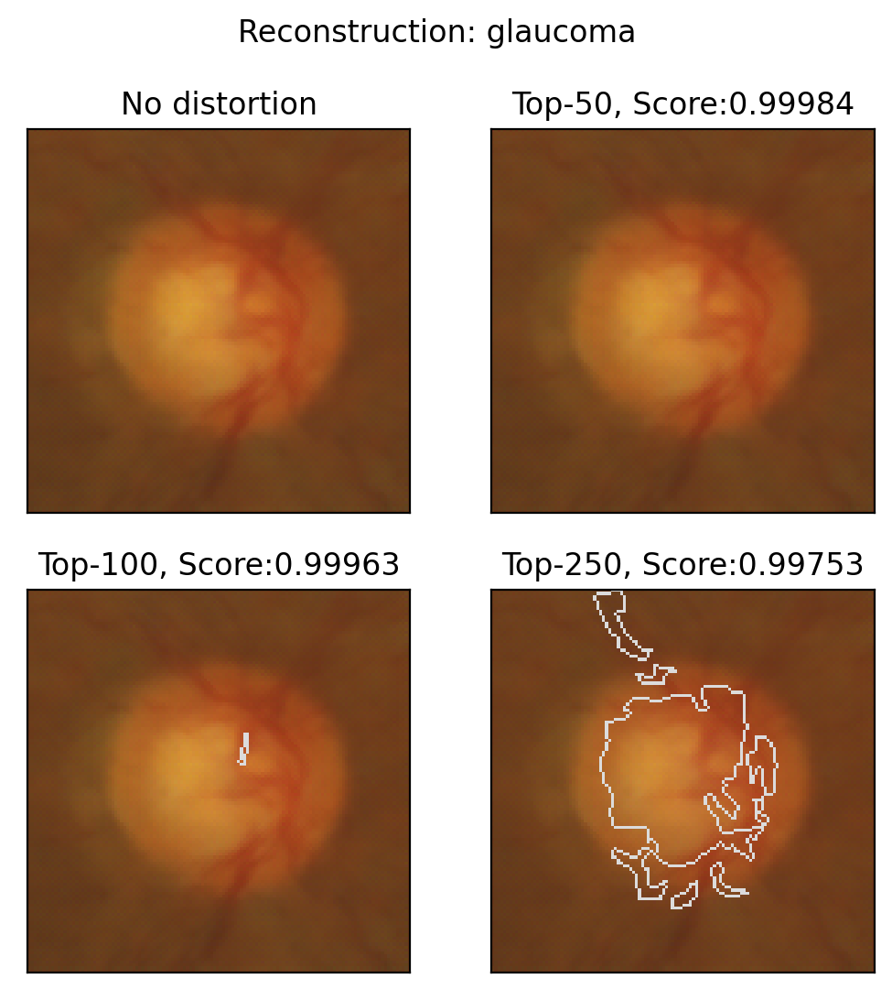

In [95]:
i = 4
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

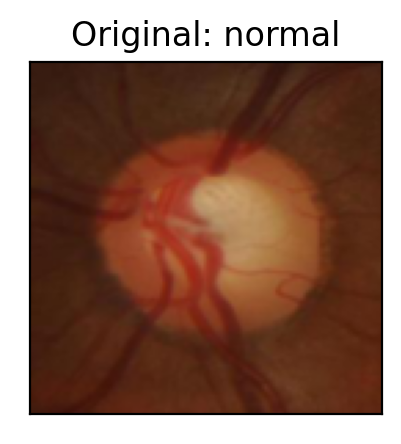

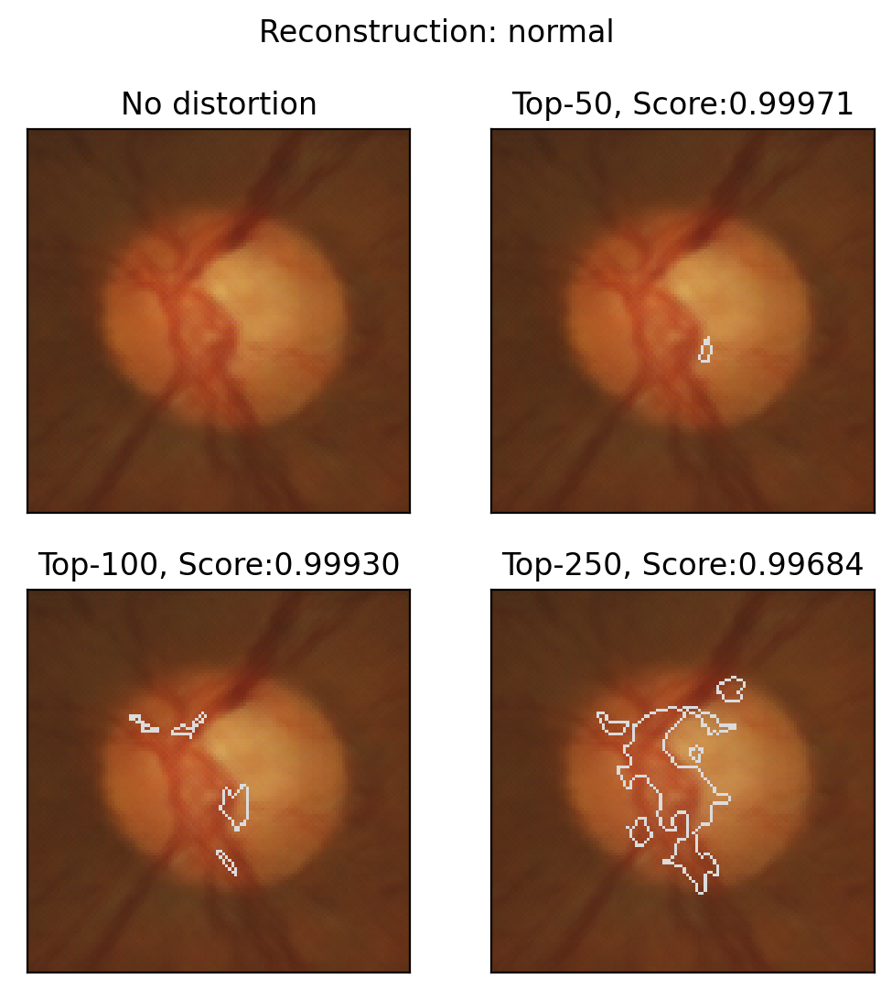

In [97]:
i = 7
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

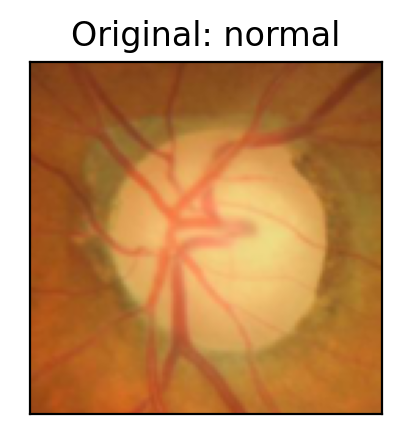

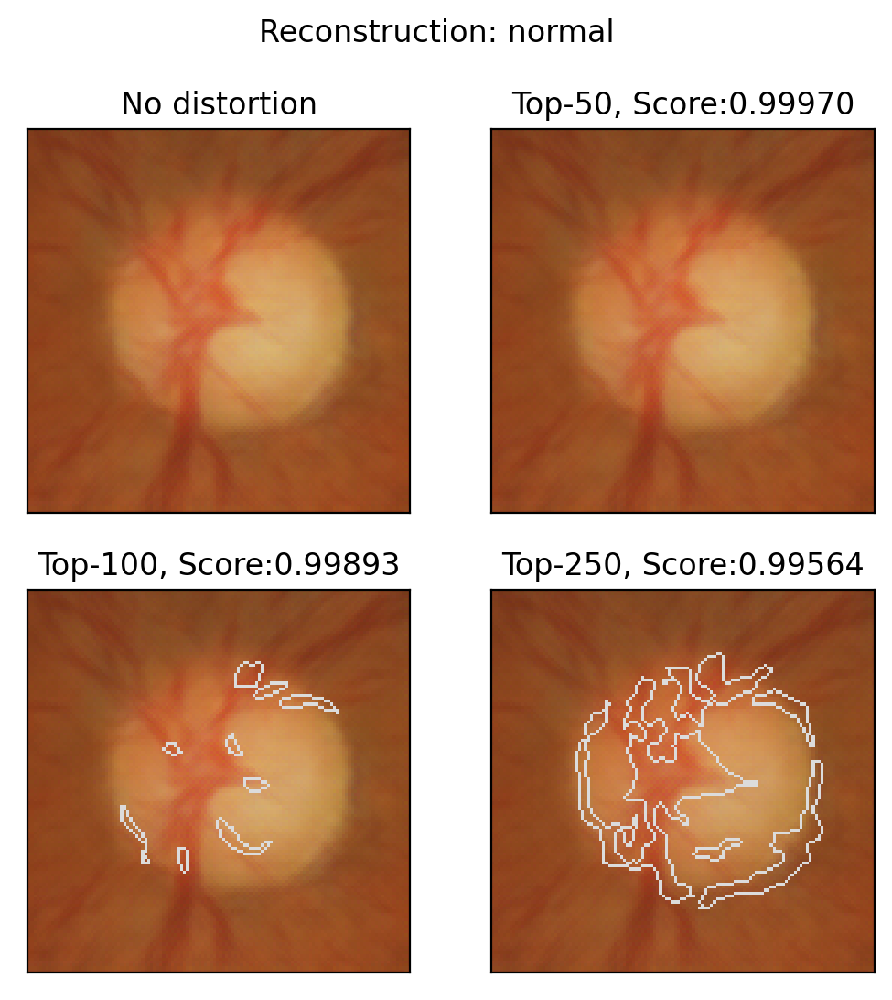

In [100]:
i = 15
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

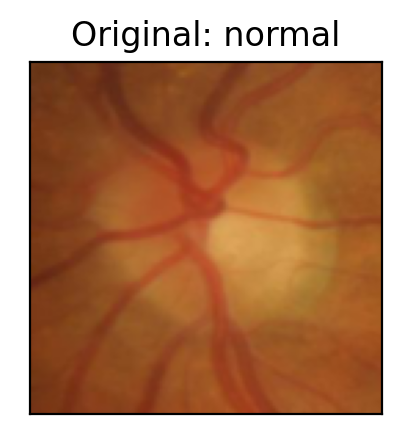

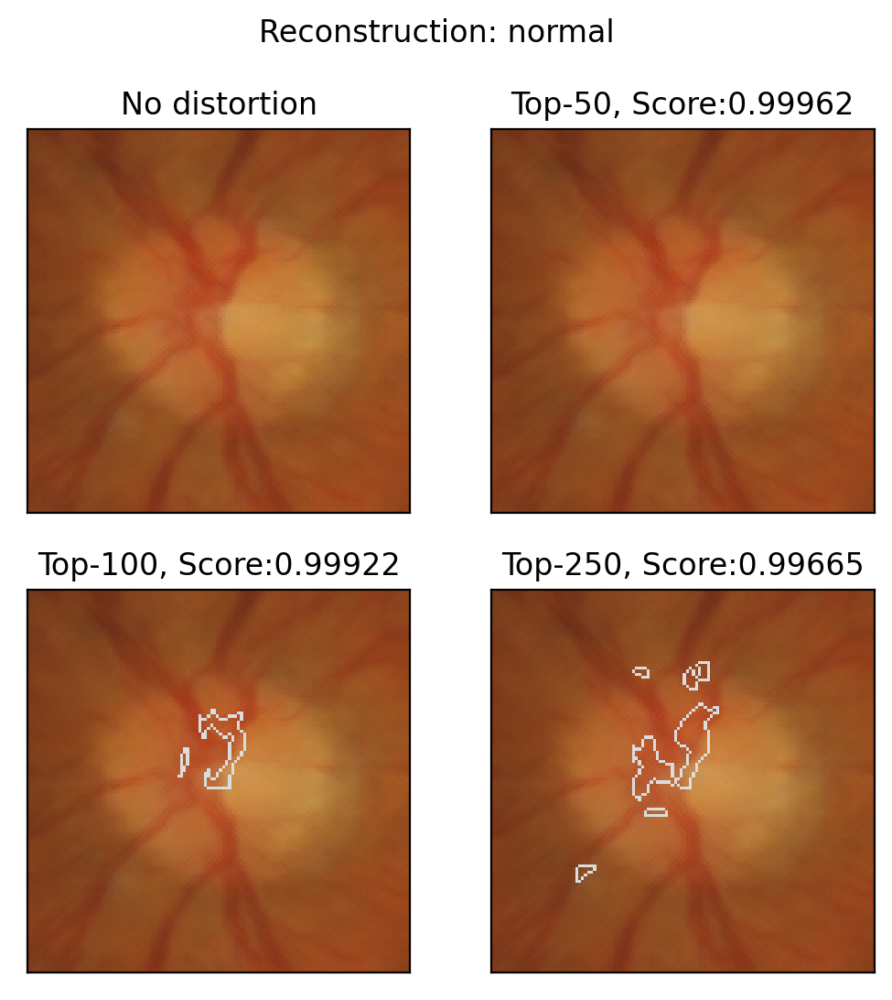

In [101]:
i = 16
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

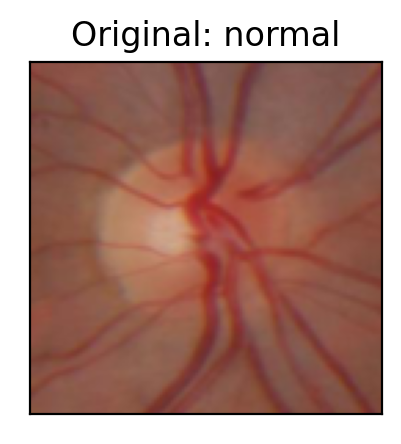

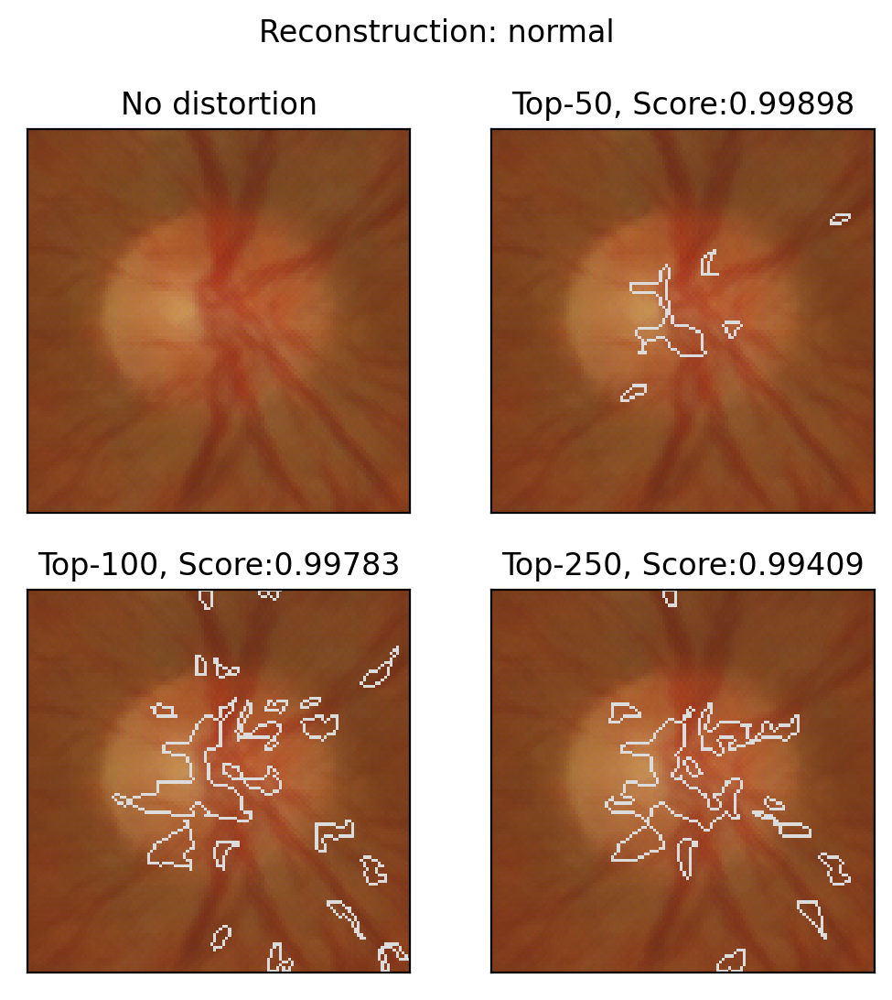

In [104]:
i = 19
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

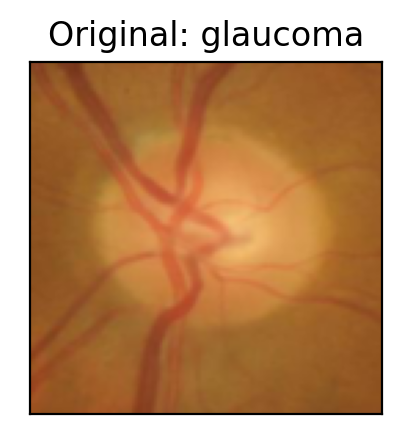

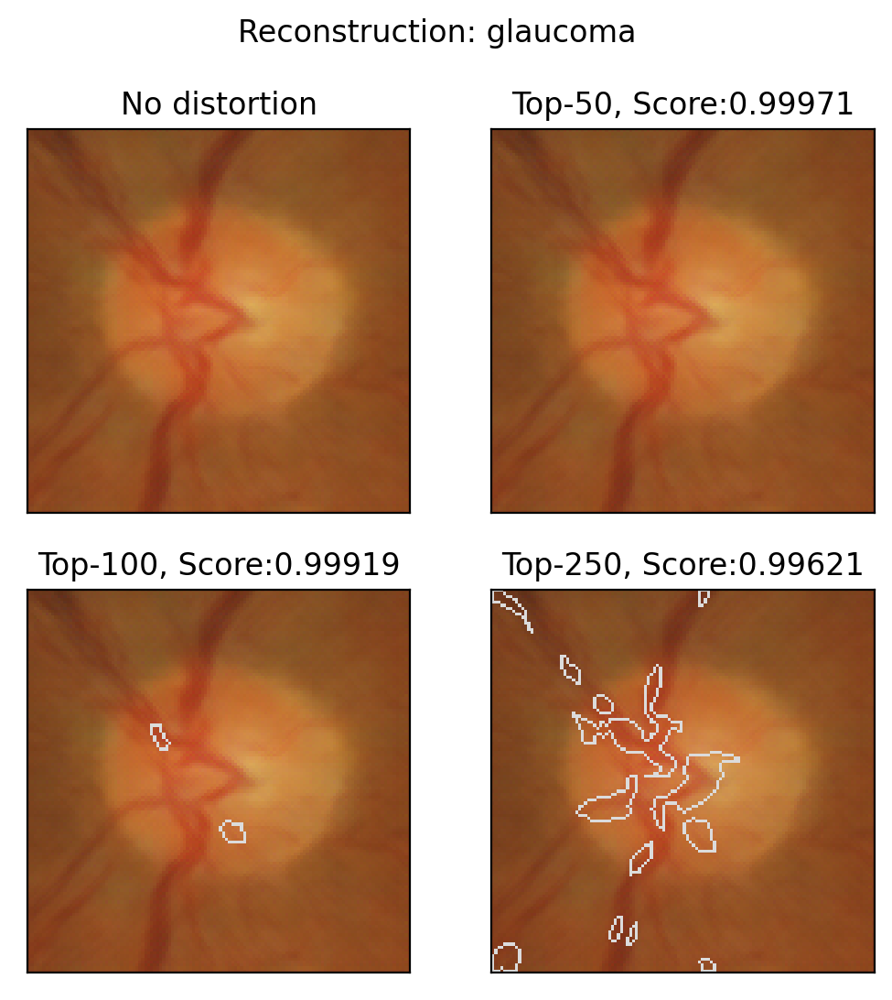

In [105]:
i = 20
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

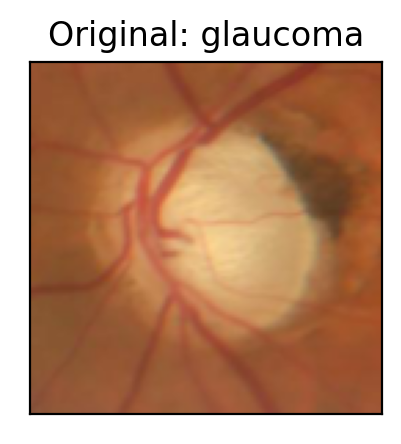

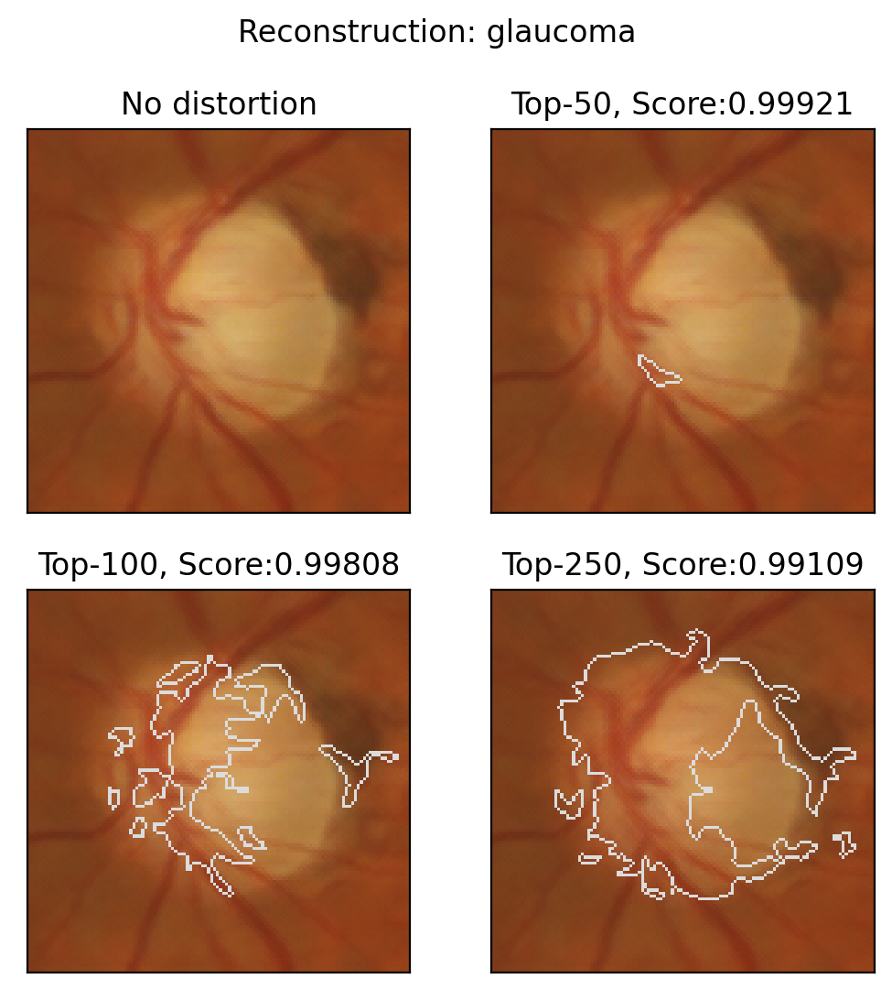

In [107]:
i = 25
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

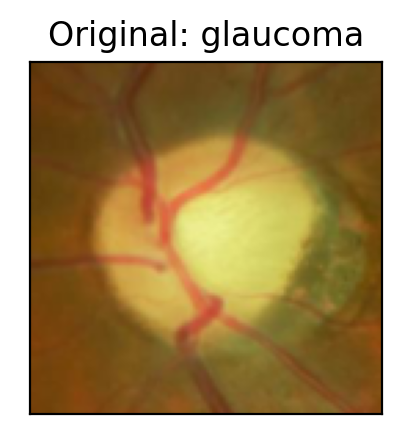

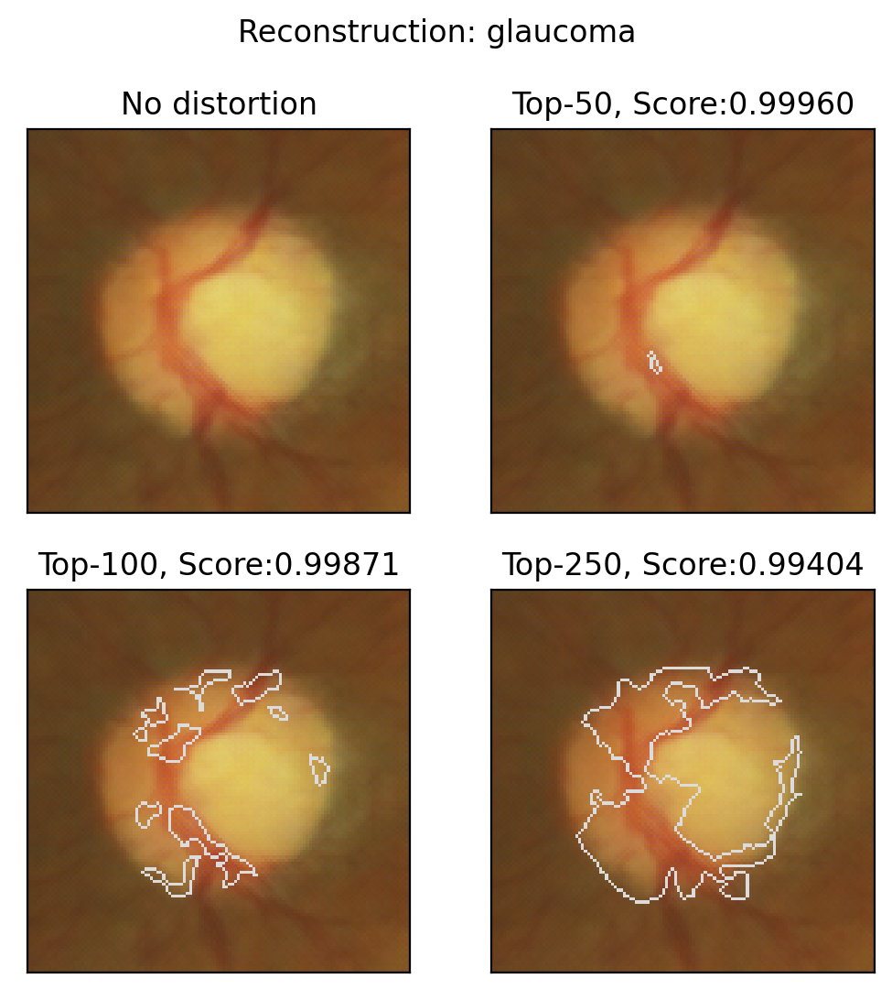

In [108]:
i = 27
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

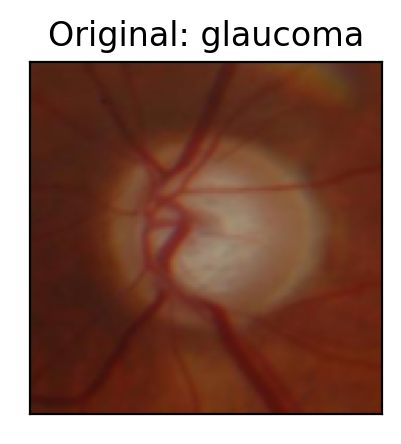

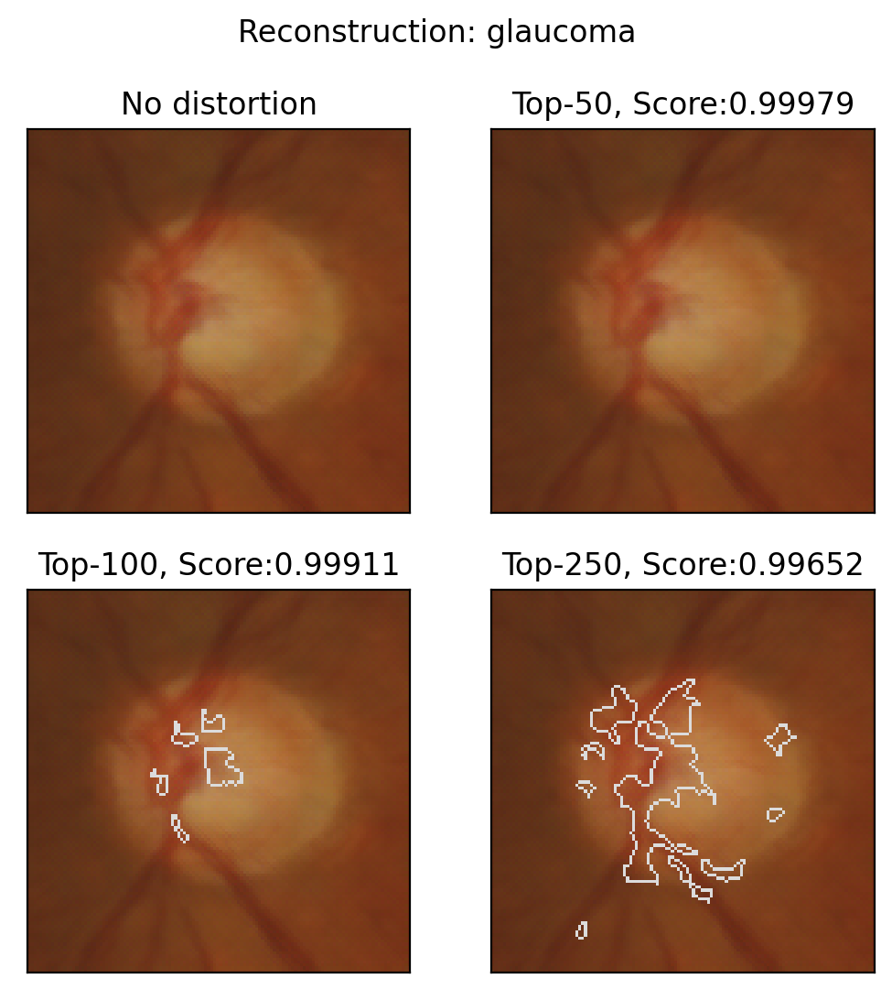

In [109]:
i = 33
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

In [1]:
i = 38
orig = data.numpy()[i].transpose((1,2,0))
rec,fa10,sc10 = show_difference1(before = images, after = images10, labels = labels,idx = i)
_,fa100,sc100 = show_difference1(before = images, after = images100, labels = labels,idx = i)
_,fa1000,sc1000 = show_difference1(before = images, after = images1000, labels = labels,idx = i)

#before,fa,score = show_difference(before = data, after = images, labels = labels,idx = 0)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1,2, 1, xticks=[], yticks=[])
plt.imshow(orig)
ax.set_title("Original: " + classes[labels[i]])


fig = plt.figure(figsize=(6, 6.1))
ax = fig.add_subplot(2,2, 1, xticks=[], yticks=[])
plt.imshow(rec)
ax.set_title("No distortion")
ax = fig.add_subplot(2,2, 2, xticks=[], yticks=[])
plt.imshow(fa10)
ax.set_title("Top-50, Score:" + str(sc10)[:7])
ax = fig.add_subplot(2,2, 3, xticks=[], yticks=[])
plt.imshow(fa100)
ax.set_title("Top-100, Score:" + str(sc100)[:7])
ax = fig.add_subplot(2,2, 4, xticks=[], yticks=[])
plt.imshow(fa1000)
ax.set_title("Top-250, Score:" + str(sc1000)[:7])
plt.suptitle("Reconstruction: " + classes[labels[i]])
plt.show()

NameError: name 'data' is not defined

In [18]:
from sklearn.manifold import TSNE

n_comp = 2
perplexity = 30

In [25]:

for i, (data,label) in enumerate(data_loader):
    y, _,_ =  model.encode(Variable(data).cuda())
    y = y.cpu().detach().numpy()
    if i == 0:
        yd = y
        lbl = label.numpy()
    else:
        yd = np.append(yd,y,axis=0)
        lbl = np.append(lbl,label.numpy(), axis=0)

In [27]:
y_embed = TSNE(n_components=2).fit_transform(yd)
#labels = ['normal','glaucoma']

0
1


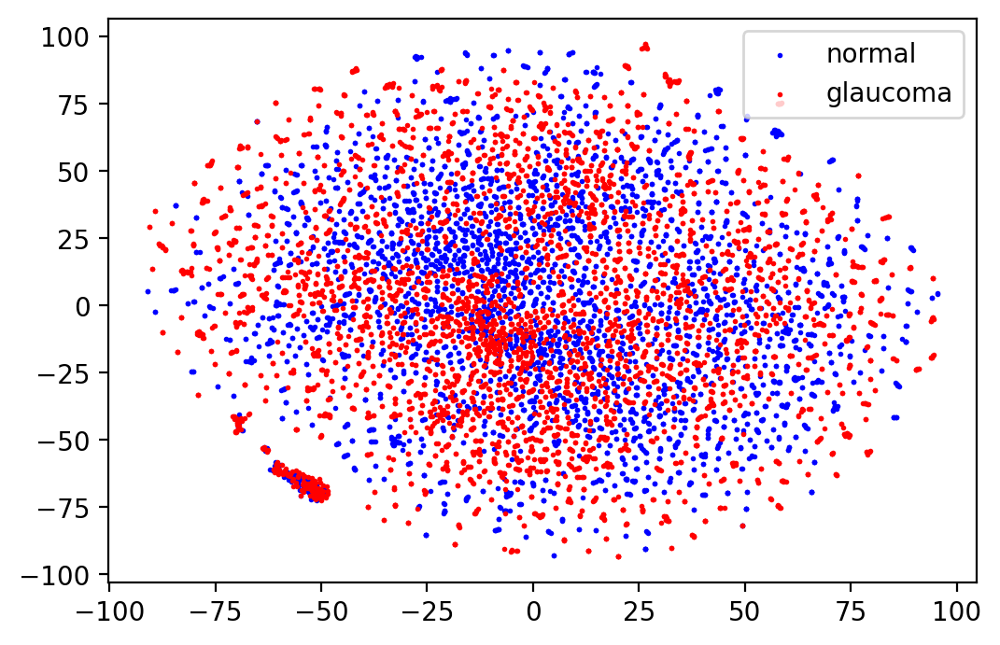

In [28]:
fig, ax = plt.subplots()
cdict = {0: 'blue', 1: 'red'}
for g in np.unique(lbl):
    print(g)
    idx = np.where(lbl == g)
    ax.scatter(y_embed[idx,0],y_embed[idx,1],c=cdict[g], label = classes[g], s = 1, alpha = 1)
ax.legend()
plt.show()

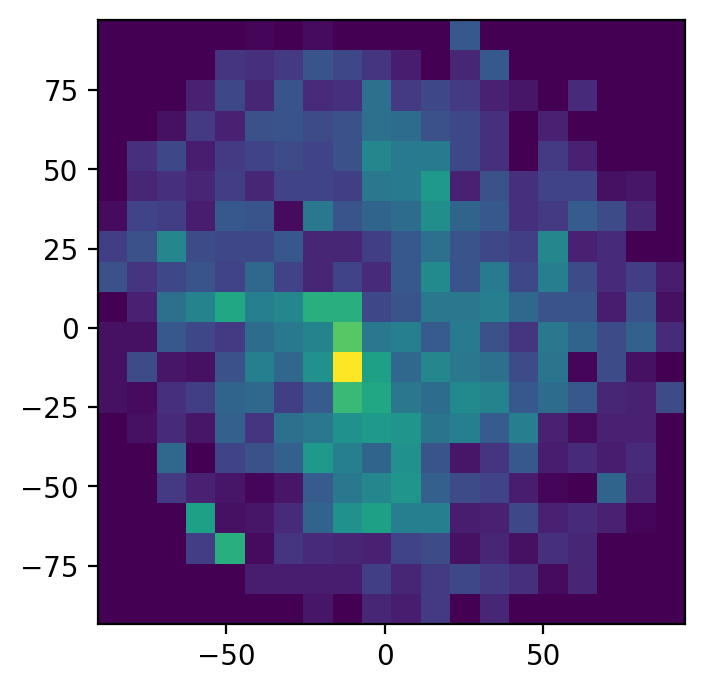

In [32]:
idx = np.where(lbl == 1)
heatmap, xedges, yedges = np.histogram2d(y_embed[idx,0].flatten(),y_embed[idx,1].flatten(),bins=20)
extent = [xedges[0],xedges[-1],yedges[0],yedges[-1]]
plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')
plt.show()

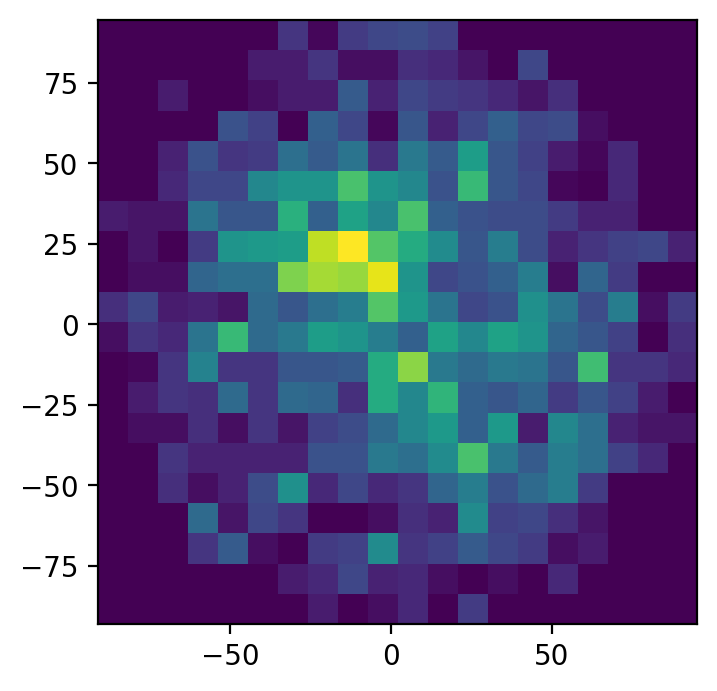

In [31]:
idx = np.where(lbl == 0)
heatmap, xedges, yedges = np.histogram2d(y_embed[idx,0].flatten(),y_embed[idx,1].flatten(), bins=20)
extent = [xedges[0],xedges[-1],yedges[0],yedges[-1]]
plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')
plt.show()

In [138]:
def gethistogram(features, label,idx,kde = False):
    classes = ['normal','glaucoma']
    fig = plt.figure(figsize=(4,3))
    sns.histplot(features[idx],kde = kde, element='step')
    plt.xlabel('Latent feature')
    plt.ylabel('Frequency')
    plt.title(classes[label[idx]])
    plt.show()

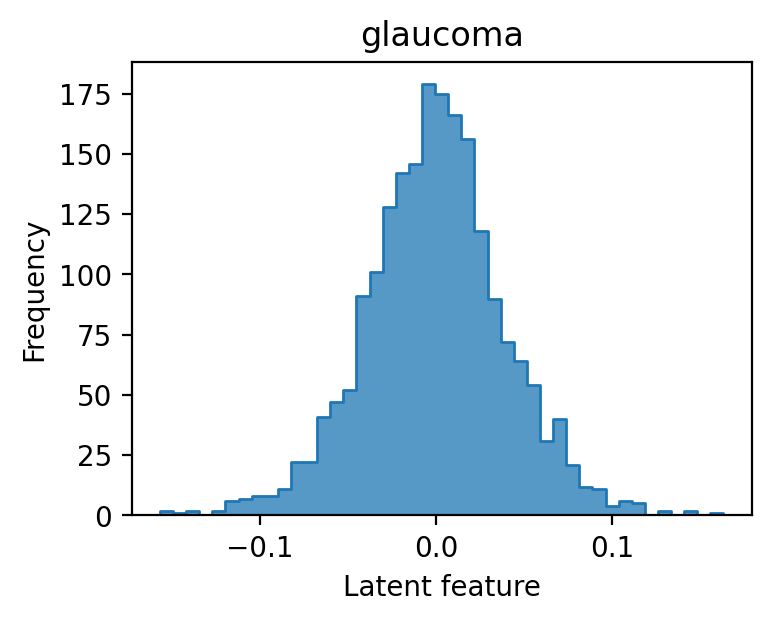

In [139]:
gethistogram(yd, lbl,0,kde = False)

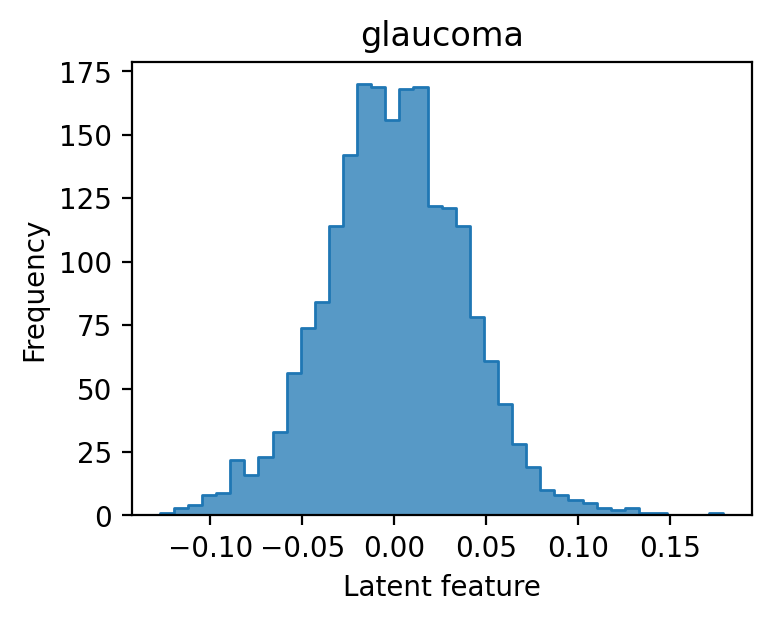

In [140]:
gethistogram(yd, lbl,1,kde = False)

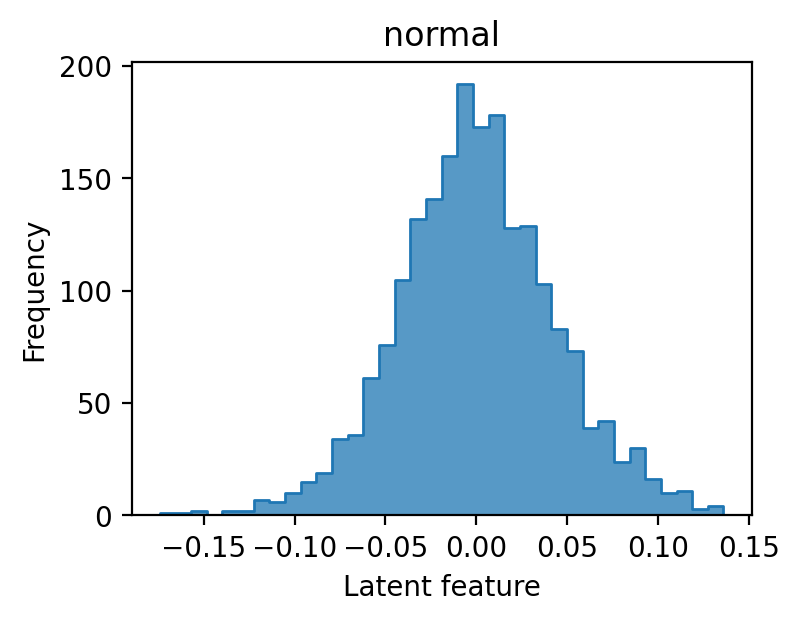

In [142]:
gethistogram(yd, lbl,3,kde = False)

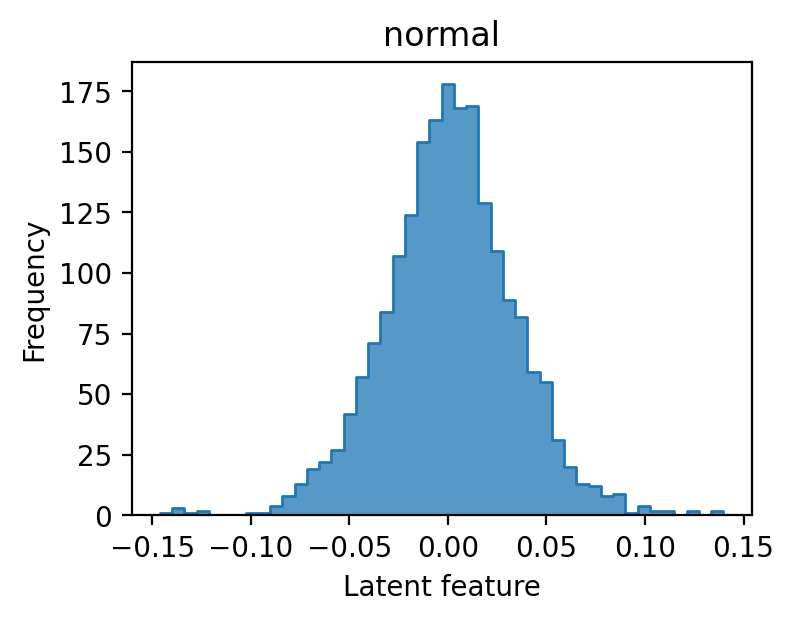

In [143]:
gethistogram(yd, lbl,4,kde = False)

In [4]:
#only on validation set
csv_path = '/home/vip/sayan-mandal/datasets/obj_criteria/20200619-objective.csv'
img_path = '/home/vip/sayan-mandal/datasets/obj_criteria/good_reduced/'

ResizeParam = 128
FD = FundusDataLoader(csv_path, img_path,transform=transforms.Compose([transforms.Resize(ResizeParam), transforms.RandomHorizontalFlip(p=0.5) ,transforms.ToTensor()]))
FD2 = FundusDataLoader(csv_path, img_path,transform=transforms.Compose([transforms.Resize(ResizeParam), transforms.ToTensor()]))

#random sampler
batch_size = 64
validation_split = .2
shuffle_dataset = True
random_seed= 42

# Creating data indices for training and validation splits:
dataset_size = len(FD)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

#train_loader = torch.utils.data.DataLoader(FD, batch_size=batch_size, sampler=train_sampler)
data_loader = torch.utils.data.DataLoader(FD2, batch_size=batch_size, sampler=valid_sampler)


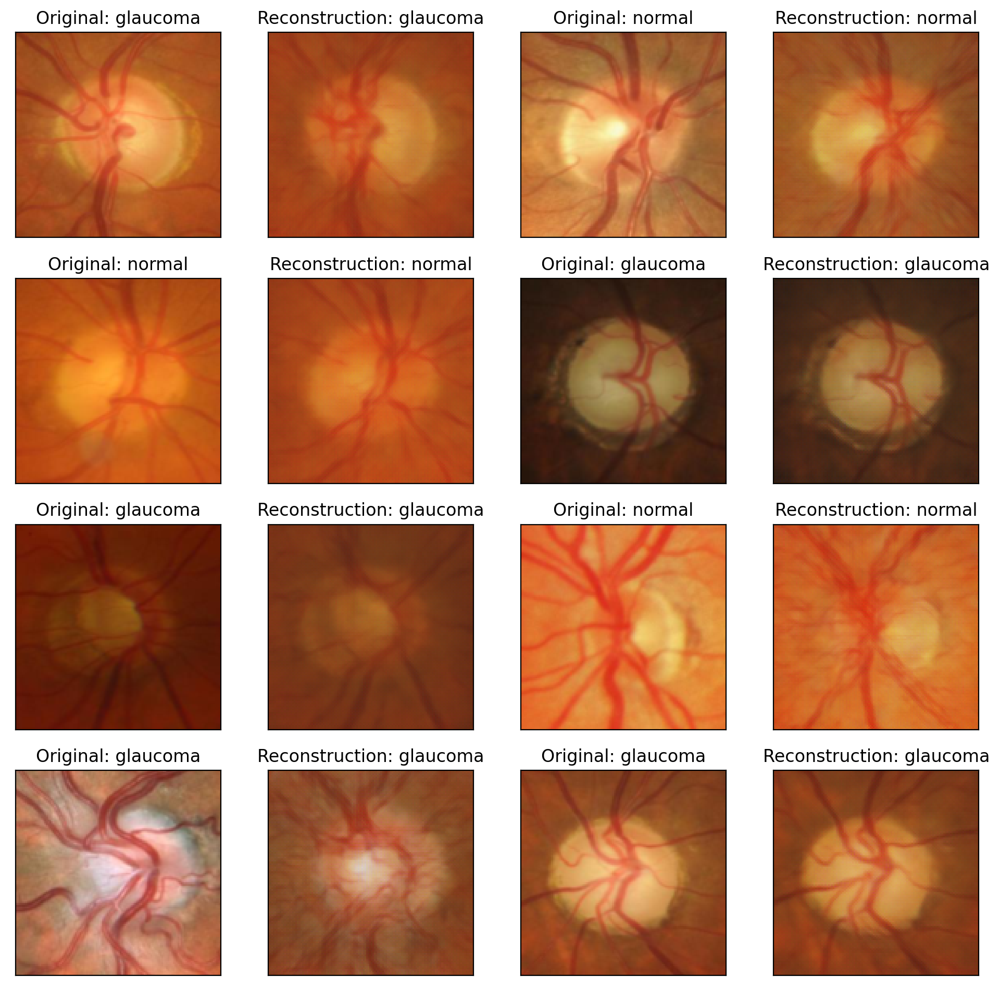

In [6]:
#Utility functions to un-normalize and display an image
def imshow(img):
    #img = img / 2 + 0.5  
    plt.imshow(np.transpose(img, (1, 2, 0))) 

#Define the image classes
classes = ['normal','glaucoma']

#Obtain one batch of training images
dataiter = iter(data_loader)
data, labels = dataiter.next()
model.eval()
images,_,_ = model(Variable(data).cuda())
images = images.detach().cpu().numpy() # convert images to numpy for display

#Plot the images
fig = plt.figure(figsize=(12, 12))
# display 20 images
idx = 0
while idx < 16:
    ax = fig.add_subplot(4,4, idx+1, xticks=[], yticks=[])
    imshow(data[idx])
    ax.set_title("Original: " + classes[labels[idx]])
    idx+=1
    ax = fig.add_subplot(4,4, idx+1, xticks=[], yticks=[])
    imshow(images[idx-1])
    ax.set_title("Reconstruction: " + classes[labels[idx-1]])
    idx+=1


In [9]:
dataiter = iter(data_loader)
data, labels = dataiter.next()
model.eval()
images,_,_ = model(Variable(data).cuda())
images = images.detach().cpu().numpy() # convert images to numpy for display

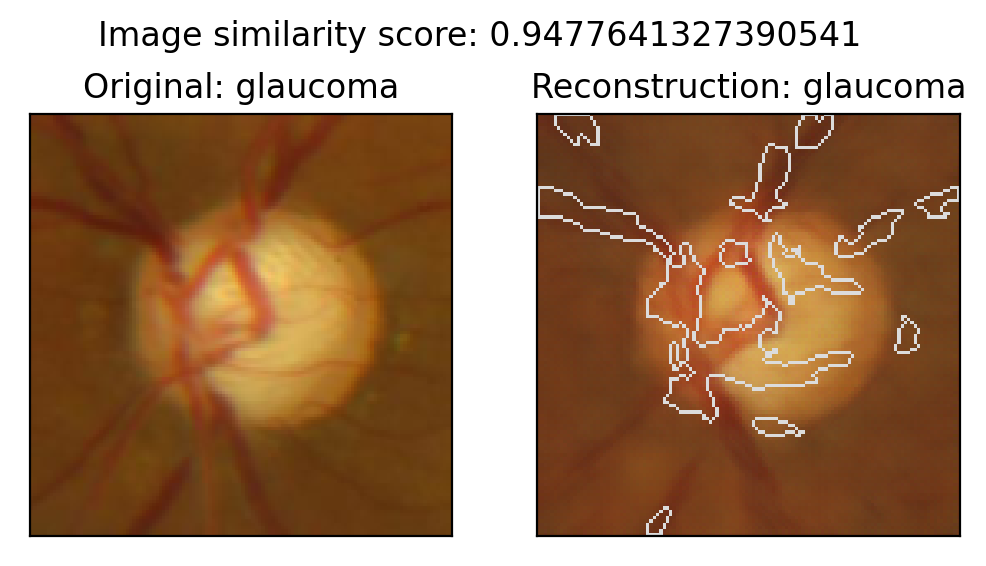

In [19]:
show_difference(idx = 7)

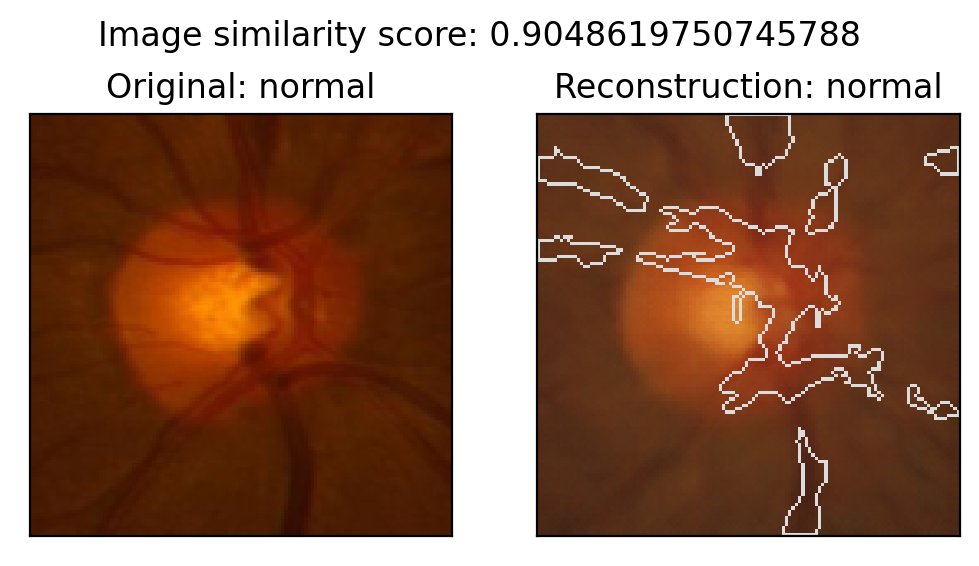

In [11]:
show_difference(idx=1)

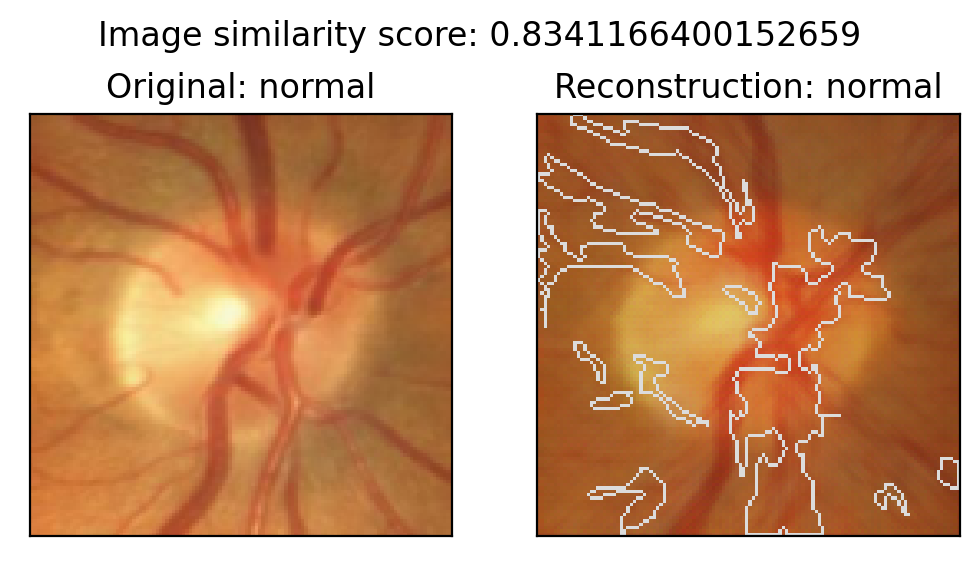

In [12]:
show_difference(idx=2)

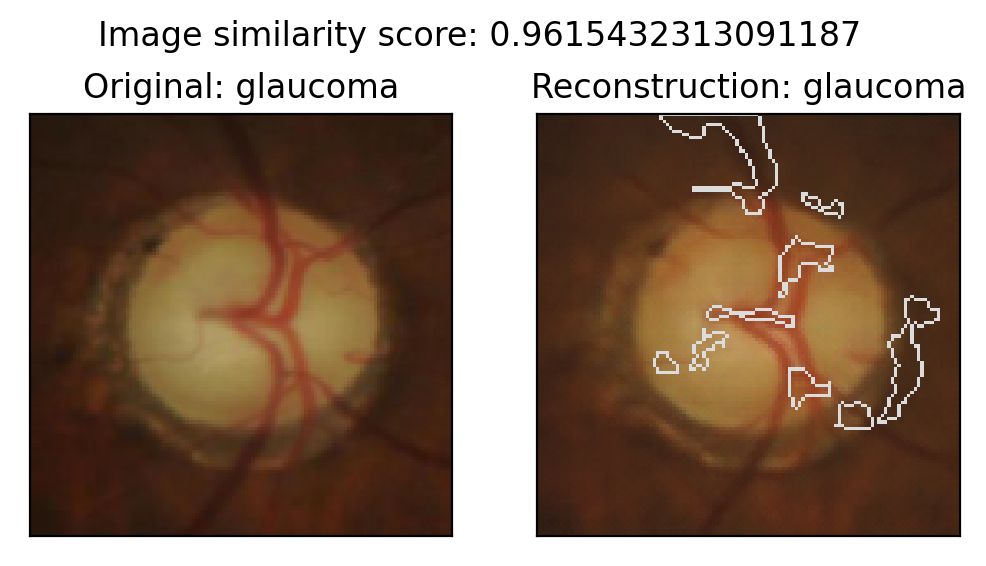

In [16]:
show_difference(idx=6)

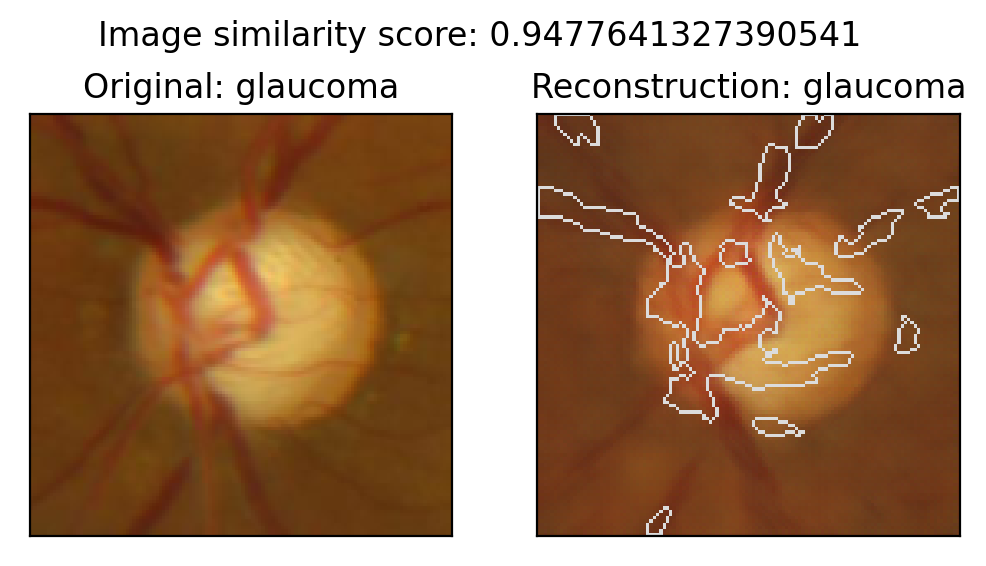

In [17]:
show_difference(idx=7)

In [5]:

for i, (data,label) in enumerate(data_loader):
    y, _,_ =  model.encode(Variable(data).cuda())
    y = y.cpu().detach().numpy()
    if i == 0:
        yd = y
        lbl = label.numpy()
    else:
        yd = np.append(yd,y,axis=0)
        lbl = np.append(lbl,label.numpy(), axis=0)

0
1


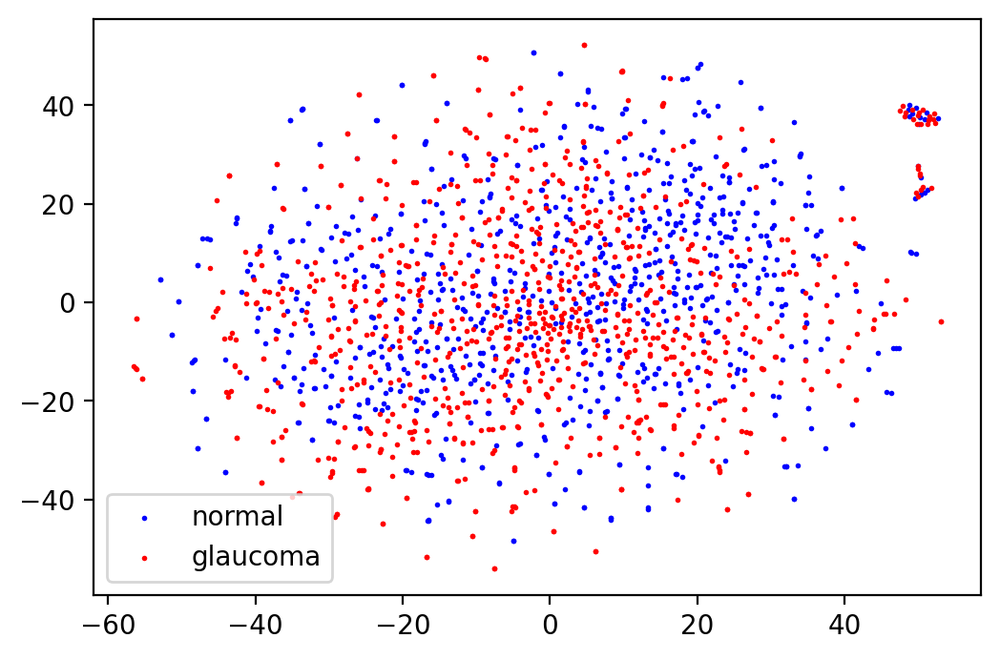

In [9]:
y_embed = TSNE(n_components=2).fit_transform(yd)
fig, ax = plt.subplots()
classes = ['normal','glaucoma']
cdict = {0: 'blue', 1: 'red'}
for g in np.unique(lbl):
    print(g)
    idx = np.where(lbl == g)
    ax.scatter(y_embed[idx,0],y_embed[idx,1],c=cdict[g], label = classes[g], s = 1, alpha = 1)
ax.legend()
plt.show()

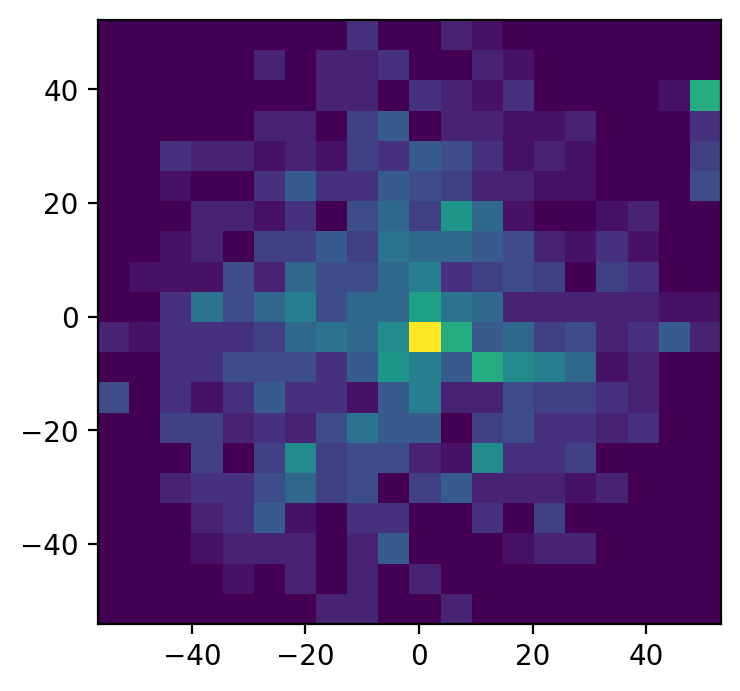

In [22]:
idx = np.where(lbl == 1)
heatmap, xedges, yedges = np.histogram2d(y_embed[idx,0].flatten(),y_embed[idx,1].flatten(),bins=20)
extent = [xedges[0],xedges[-1],yedges[0],yedges[-1]]
plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')
plt.show()

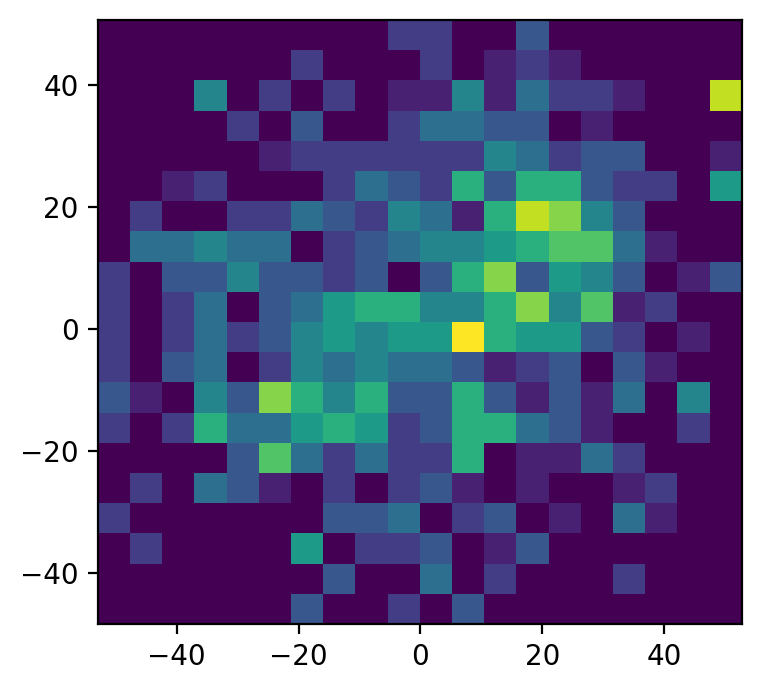

In [23]:
idx = np.where(lbl == 0)
heatmap, xedges, yedges = np.histogram2d(y_embed[idx,0].flatten(),y_embed[idx,1].flatten(),bins=20)
extent = [xedges[0],xedges[-1],yedges[0],yedges[-1]]
plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')
plt.show()